In [1]:
import numpy as np
import h5py
import matplotlib.pyplot as plt
from scipy import signal
import dataloader_halogaland.dataloader as dl
#from dataloader_halogaland.processer import welch_plot
import os
import koma.oma, koma.plot
import koma.clustering
from time import time
import pandas as pd
from dataloader_halogaland.plot import stabilization_diagram

/Users/emilneby/miniforge3/envs/master/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/plot.py:147: SyntaxWarning: "is" with a literal. Did you mean "=="?
  if renderer is 'default':


In [2]:
print((os.listdir("/../../../../../Volumes/LaCie/")))

['.Spotlight-V100', '.fseventsd', 'Warranty.pdf', 'Autorun.inf', 'Start_Here_Win.exe', 'Seagate', '.VolumeIcon.icns', 'Start_Here_Mac.app', '.VolumeIcon.ico', '._.', 'System Volume Information', '$RECYCLE.BIN', '20220513 Pakke ODK', 'Data testkampanje mai 2022 - Master22', 'Nidarosdomen', 'Halogaland_sixth_try.hdf5']


In [4]:
path = '../Data/Halogaland_second_try.hdf5'
analysis_length = 30 #minutes - 10 minutes equals 1200 data points in sampling frequency of 2 Hz
cutoff_frequency = 1 #Hz -> this means sampling frequency becomes 2Hz

loader= dl.HDF5_dataloader(os.getcwd()+'/../../../../../../Volumes/LaCie/Halogaland_sixth_try.hdf5')

Available accelerometers: ['A01-1', 'A03-1', 'A03-2', 'A04-1', 'A04-2', 'A05-1', 'A05-2', 'A06-1', 'A06-2', 'A06-3', 'A06-4', 'A07-1', 'A07-2', 'A08-1', 'A08-2', 'A08-3', 'A08-4', 'A09-1', 'A09-2', 'A10-1', 'A10-2', 'A11-1']


### Define SSI parameters

In [5]:
i = 100
s = 6
fs = 2
orders = np.arange(2, 150+2, 2)

stabcrit = {'freq':0.05, 'damping': 0.1, 'mac': 0.1}

### Predefining outer loop

In [6]:
#Removing first 10 period which is severely incomplete.
loader.periods = loader.periods[10:]
print(loader.periods)

['2022-02-02-00-00-00', '2022-02-02-08-00-00', '2022-02-02-16-00-00', '2022-02-03-00-00-00', '2022-02-03-08-00-00', '2022-02-03-16-00-00', '2022-02-04-00-00-00', '2022-02-04-08-00-00', '2022-02-04-16-00-00', '2022-02-05-00-00-00', '2022-02-05-08-00-00', '2022-02-05-16-00-00', '2022-02-06-00-00-00', '2022-02-06-08-00-00', '2022-02-06-16-00-00', '2022-02-07-00-00-00', '2022-02-07-08-00-00', '2022-02-07-16-00-00', '2022-02-08-00-00-00', '2022-02-08-08-00-00', '2022-02-08-16-00-00', '2022-02-09-00-00-00', '2022-02-09-08-00-00', '2022-02-09-16-00-00', '2022-02-10-00-00-00', '2022-02-10-08-00-00', '2022-02-10-16-00-00', '2022-02-11-00-00-00', '2022-02-11-08-00-00', '2022-02-11-16-00-00', '2022-02-12-00-00-00', '2022-02-12-08-00-00', '2022-02-12-16-00-00', '2022-02-13-00-00-00', '2022-02-13-08-00-00', '2022-02-13-16-00-00', '2022-02-14-00-00-00', '2022-02-14-08-00-00', '2022-02-14-16-00-00', '2022-02-15-00-00-00', '2022-02-15-08-00-00', '2022-02-15-16-00-00', '2022-02-16-00-00-00', '2022-02-1

In [7]:
number_of_periods = len(loader.periods)
print("Number of perdiods to run " + str(number_of_periods))
freq_modes = []
number_in_sample = 2*60*analysis_length

Number of perdiods to run 78


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 1 of 16 done in 80.46505975723267 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 2 of 16 done in 67.7218849658966 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 3 of 16 done in 77.17548108100891 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 4 of 16 done in 67.70373511314392 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 5 of 16 done in 76.34561491012573 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 6 of 16 done in 80.38119101524353 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 7 of 16 done in 64.56163287162781 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 8 of 16 done in 74.13420796394348 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 9 of 16 done in 72.87214803695679 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 10 of 16 done in 64.98706412315369 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 11 of 16 done in 75.87475991249084 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 12 of 16 done in 71.83998394012451 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 13 of 16 done in 66.4952597618103 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 14 of 16 done in 69.55719494819641 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 15 of 16 done in 65.45244002342224 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 16 of 16 done in 65.50898909568787 sec. Period 3 of 78 done. Number of skipped periods: 2.


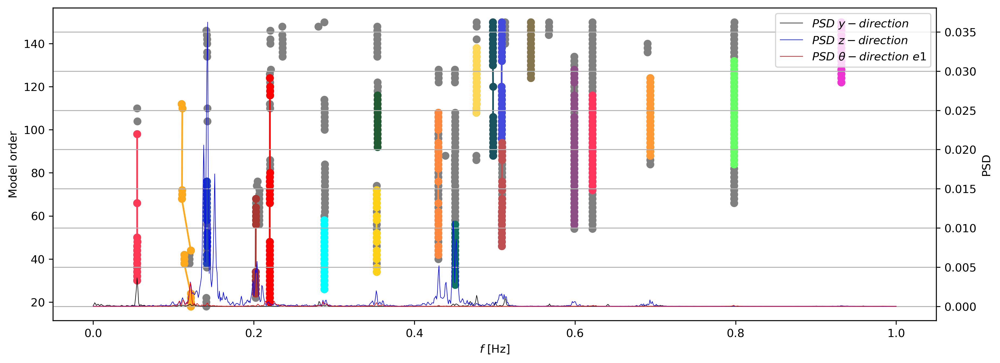

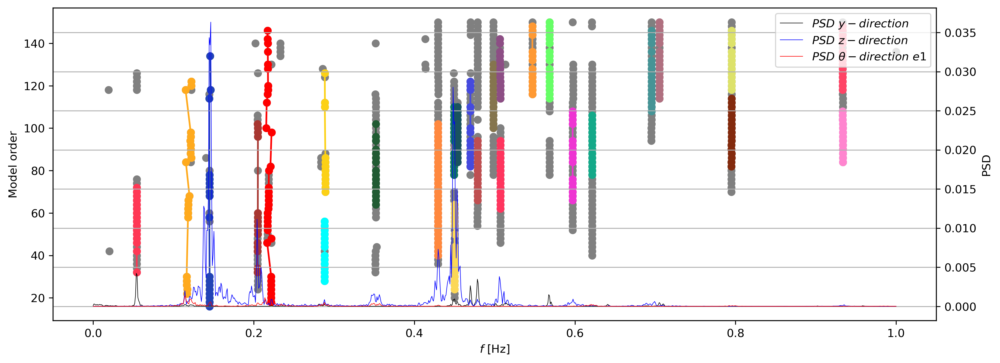

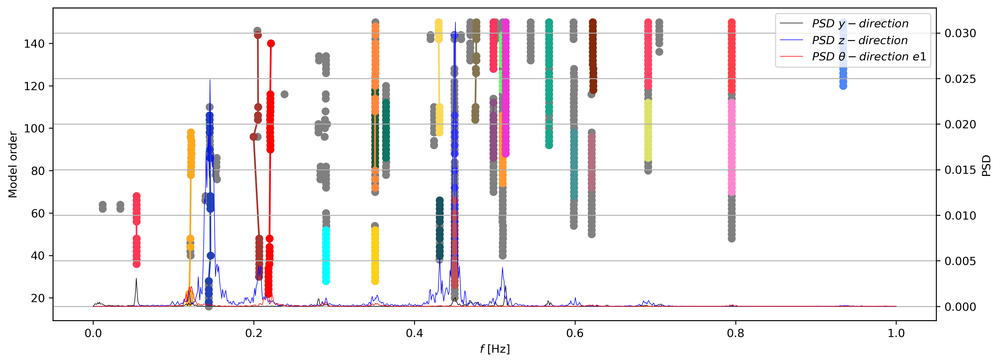

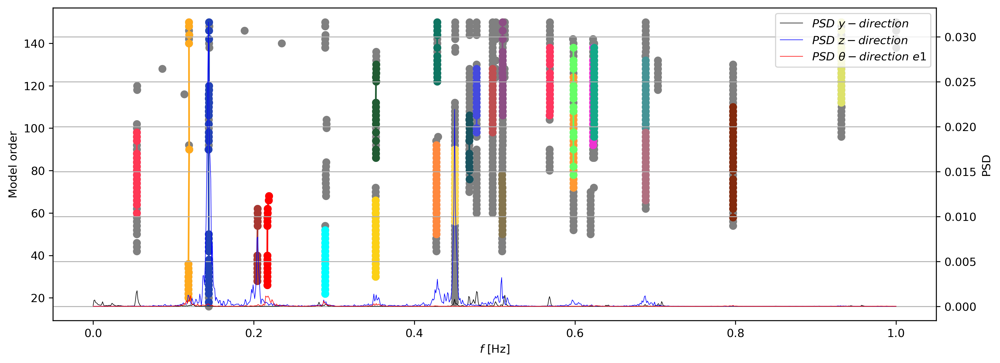

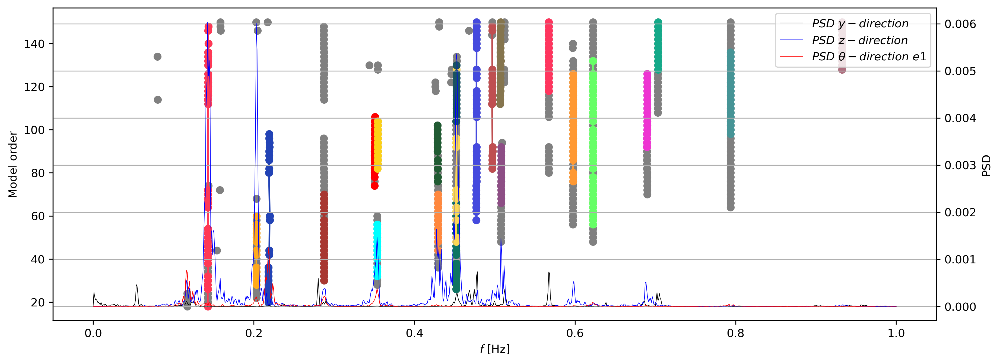

...

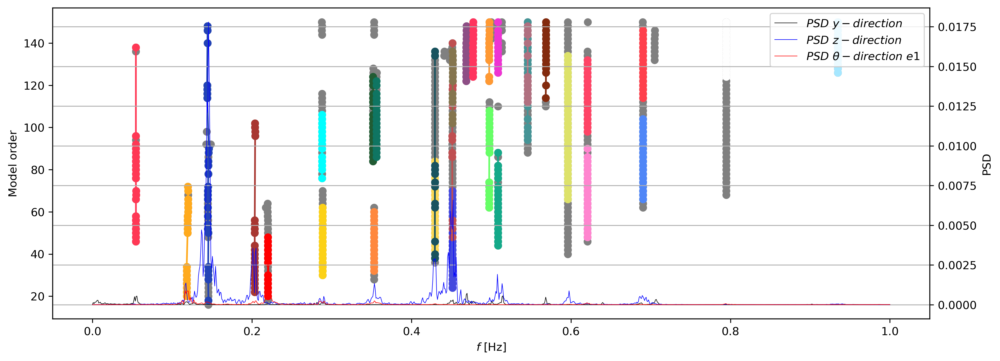

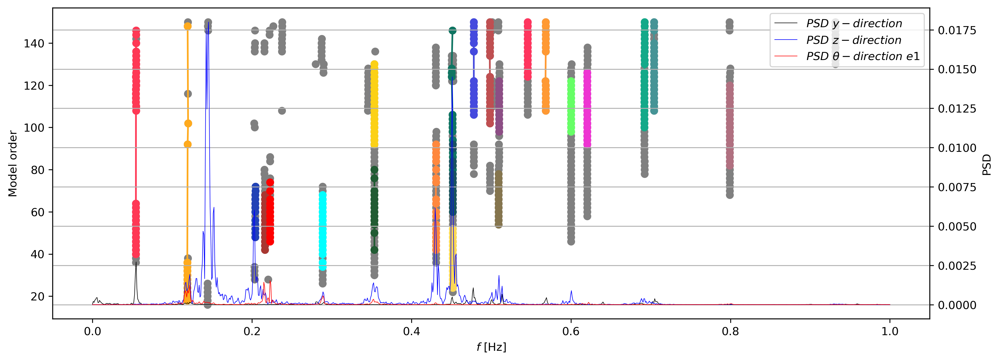

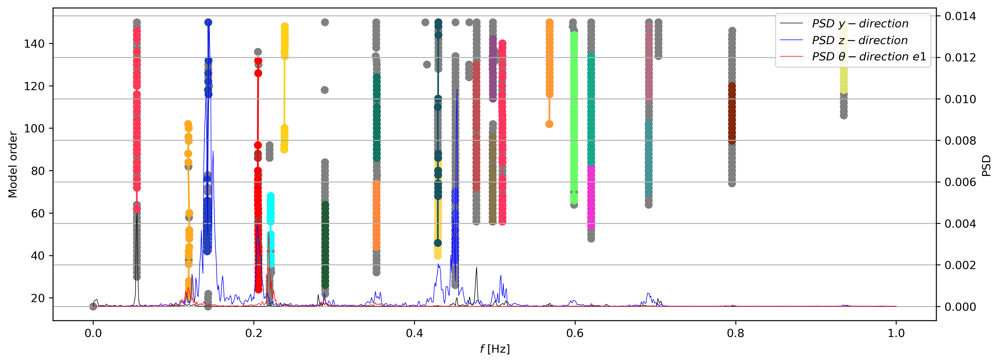

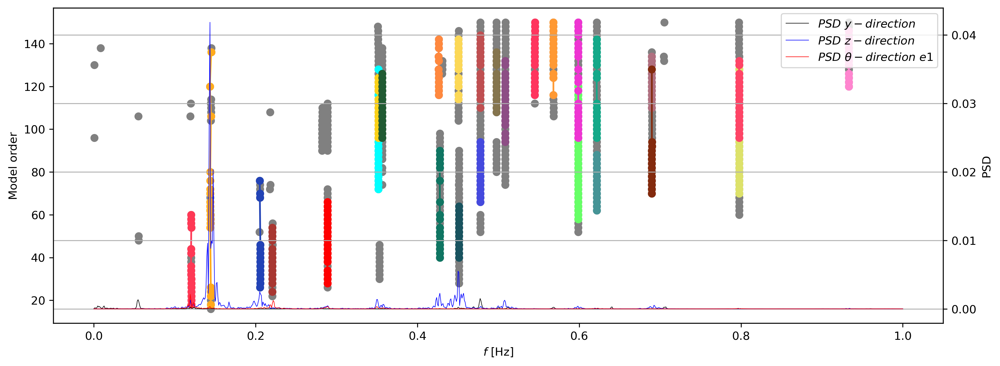

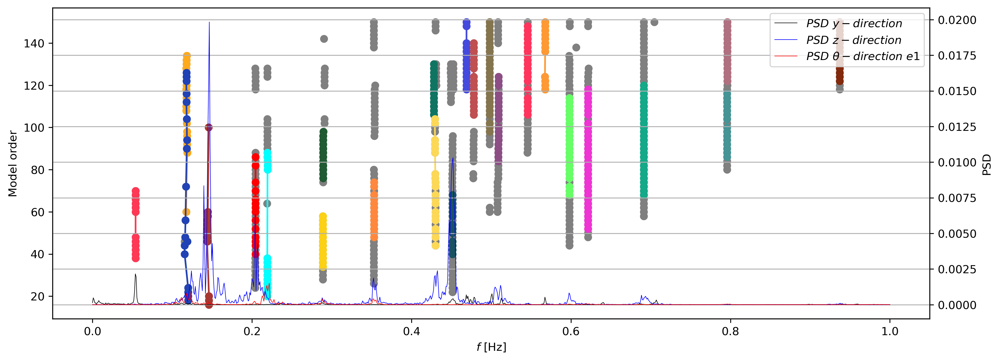

One or more channels are missing, period skipped.
One or more channels are missing, period skipped.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 1 of 16 done in 65.87942886352539 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 2 of 16 done in 79.81902599334717 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 3 of 16 done in 67.28244709968567 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 4 of 16 done in 64.56734323501587 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 5 of 16 done in 63.11291217803955 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 6 of 16 done in 63.250219106674194 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 7 of 16 done in 72.97351288795471 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 8 of 16 done in 80.85449600219727 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 9 of 16 done in 77.63678097724915 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 10 of 16 done in 68.35344886779785 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 11 of 16 done in 69.39085912704468 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 12 of 16 done in 59.92384219169617 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 13 of 16 done in 61.056015968322754 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 14 of 16 done in 74.99887585639954 sec. Period 3 of 78 done. Number of skipped periods: 2.


/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: divide by zero encountered in divide
  diff = (arr1-arr2)/scaling
/Users/emilneby/PyCharmProjects/AOMA_Halogaland/koma/clustering.py:46: RuntimeWarning: invalid value encountered in divide
  diff = (arr1-arr2)/scaling
/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 15 of 16 done in 69.01380014419556 sec. Period 3 of 78 done. Number of skipped periods: 2.


/var/folders/xg/ddkjb2x96w167hqnv_gjv_v40000gn/T/ipykernel_16235/3958425484.py:35: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)


Time serie 16 of 16 done in 67.35949778556824 sec. Period 3 of 78 done. Number of skipped periods: 2.


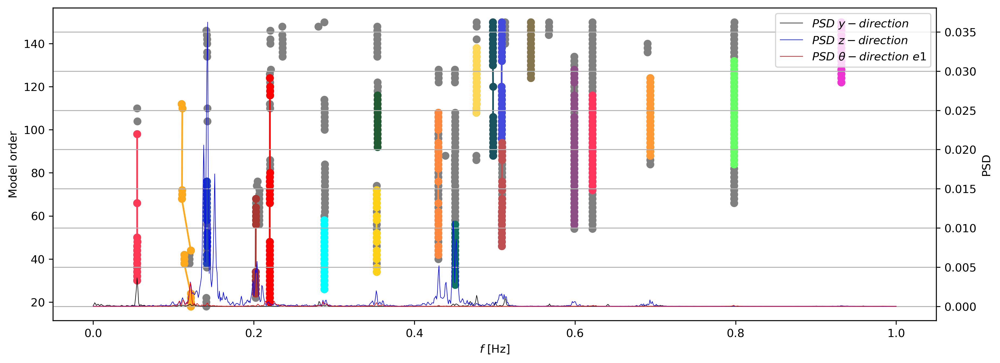

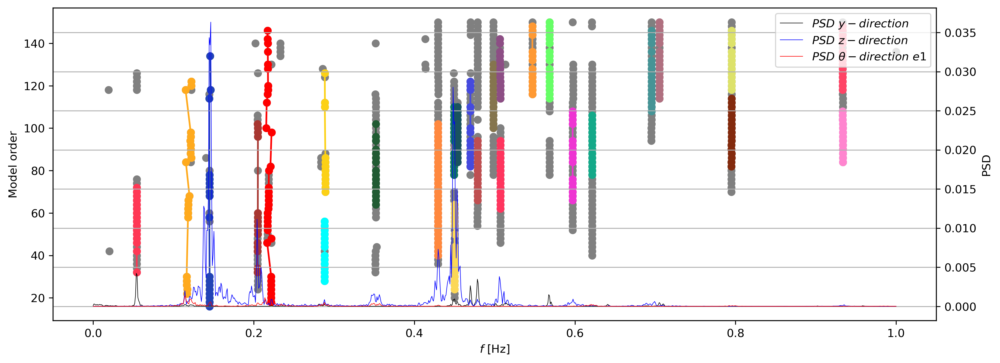

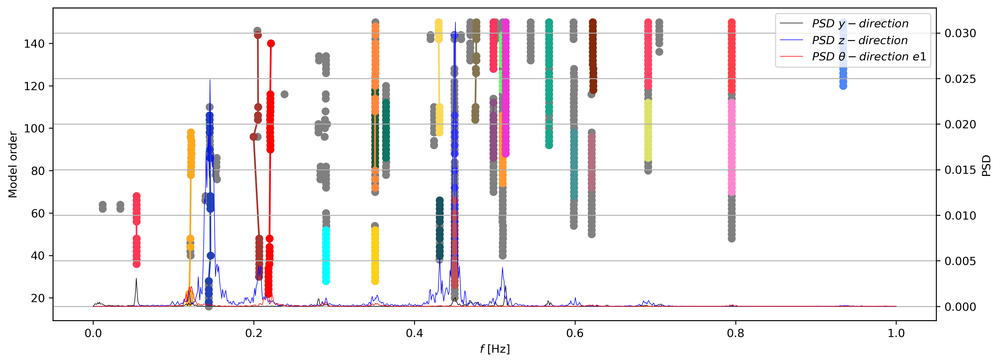

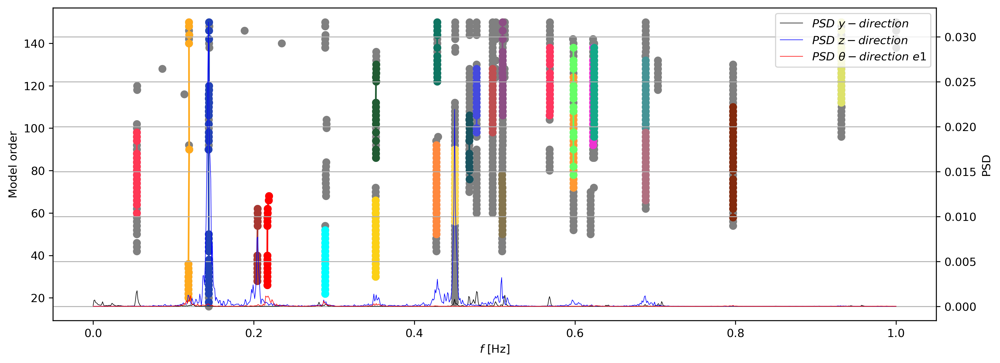

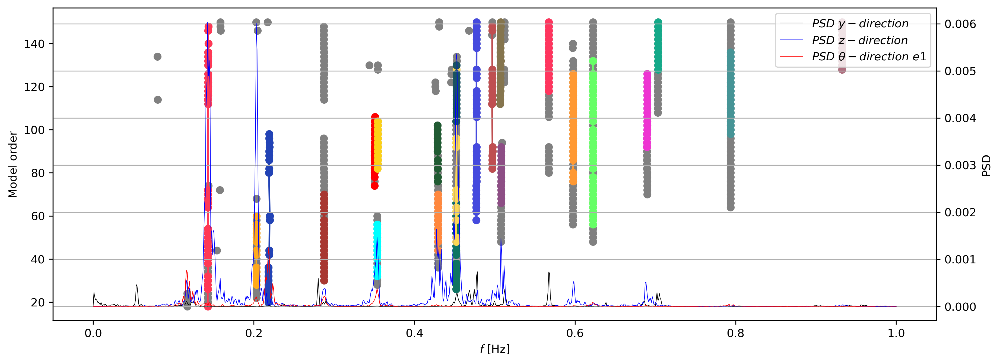

...

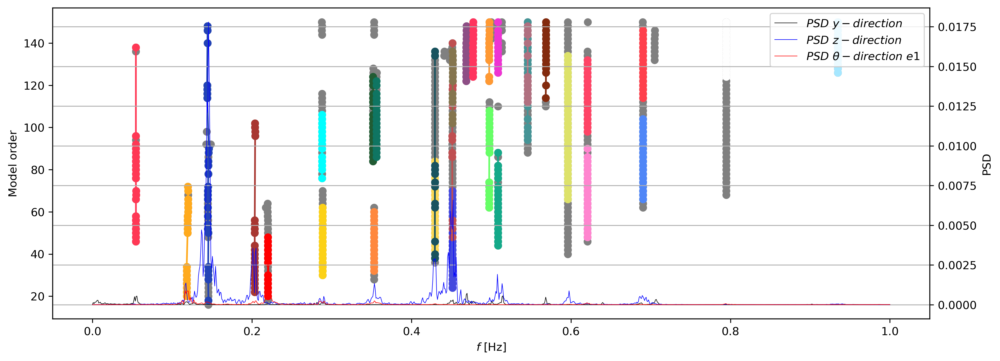

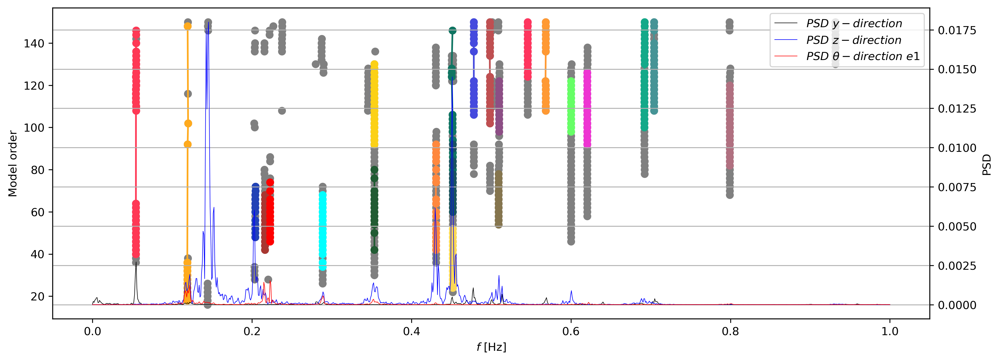

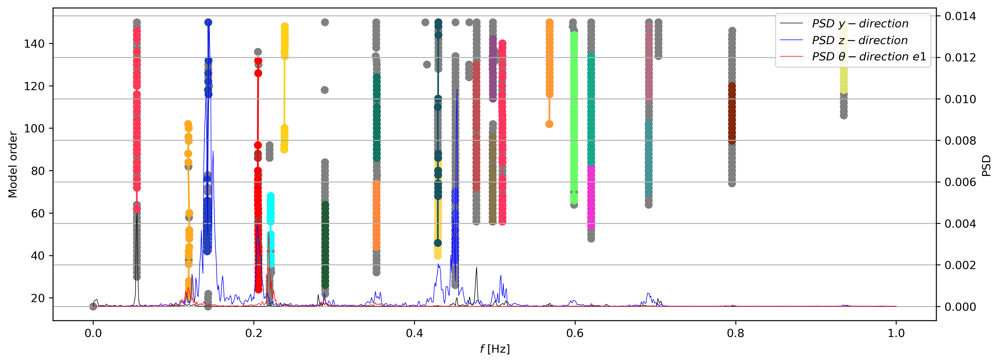

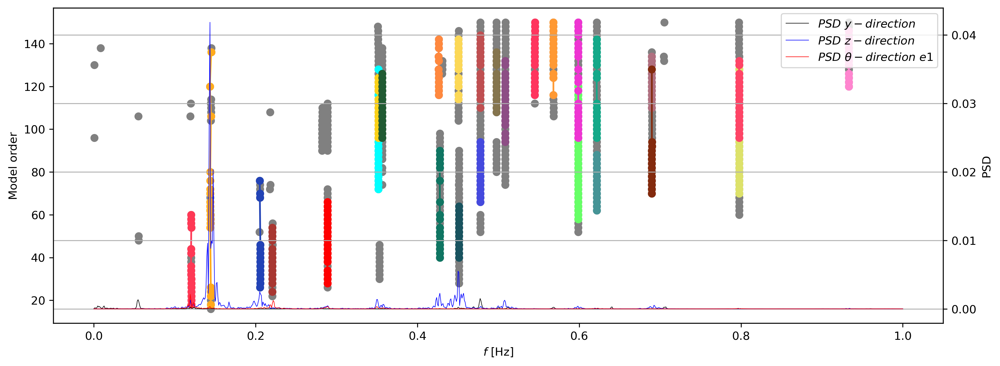

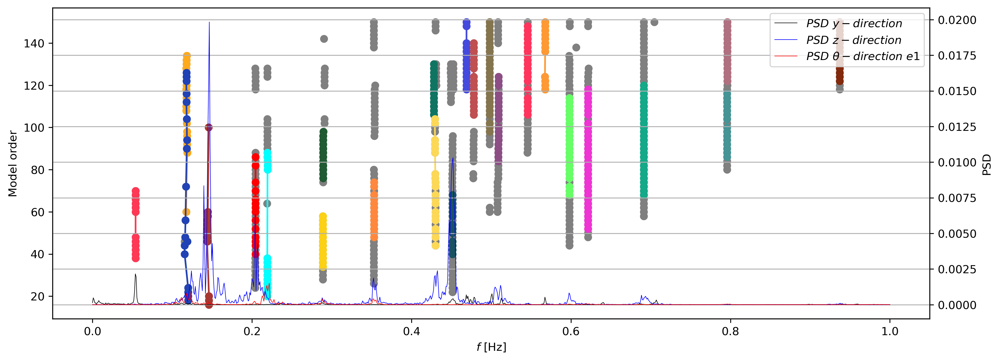

In [9]:
skipped = 0
for period in range(number_of_periods-75):
    #remove 10 periods and start at the 10th period
    acc = loader.load_all_acceleration_data(loader.periods[period], preprosess=True, cutoff_frequency=cutoff_frequency, filter_order=10)

    #print(type(acc))
    #If all channels are present, proceed with split up in intervals and perform Cov-SSI and clustering, if not, move to the next period
    if isinstance(acc, np.ndarray):
        acc = np.array_split(acc, acc.shape[0]/number_in_sample)
        #print(len(acc))

        for j in range(len(acc)):

            t0 = time()

            #Cov-SSI call
            lambd, phi = koma.oma.covssi(acc[j], fs, i, orders, showinfo=False) # find poles by Cov-SSI
            lambd_stab, phi_stab, orders_stab, ix_stab = koma.oma.find_stable_poles(lambd, phi, orders, s, stabcrit=stabcrit, indicator='mac') # Stable poles

            #Pole clustering
            pole_clusterer = koma.clustering.PoleClusterer(lambd_stab, phi_stab, orders_stab, min_cluster_size=10, min_samples=10, scaling={'mac':1.0, 'lambda_real':0.7, 'lambda_imag': 0.5})
            prob_threshold = 0.5   #probability of pole to belong to cluster, based on estimated "probability" density function
            args = pole_clusterer.postprocess(prob_threshold=prob_threshold, normalize_and_maxreal=True)

            xi_auto, omega_n_auto, phi_auto, order_auto, probs_auto, ixs_auto = koma.clustering.group_clusters(*args)

            #plot_koma.plot_stab_from_KOMA(np.array(omega_n_auto)/2/np.pi, order_auto).savefig("results/realization_" + str(j) + ".jpg")

            xi_mean = np.array([np.mean(xi_i) for xi_i in xi_auto])
            fn_mean = np.array([np.mean(om_i) for om_i in omega_n_auto])/2/np.pi

            xi_std = np.array([np.std(xi_i) for xi_i in xi_auto])
            fn_std = np.array([np.std(om_i) for om_i in omega_n_auto])/2/np.pi

            stab_diag = stabilization_diagram(acc[j], fs, 2, (np.array(omega_n_auto)/2/np.pi), np.array(order_auto), all_freqs=np.abs(lambd_stab)/2/np.pi, all_orders=orders_stab)
            plt.savefig("plots/stab_diag/stabilization_diagram_" + str(period+1) + "_" + str(j+1) + ".jpg")

            freq_modes.append([freq for freq in fn_mean])

            res_data = np.vstack([fn_mean, 100*xi_mean]).T
            results = pd.DataFrame(res_data, columns=['$f_n$ [Hz]', r'$\xi$ [%]'])
            results.to_csv(path_or_buf='results.csv', mode='a')

            t1 = time()
            print("Time serie " + str(j+1) + " of " + str(len(acc)) + " done in " + str(t1-t0) + " sec. Period " + str(period+1) + " of " + str(number_of_periods) + " done. Number of skipped periods: " + str(skipped)+".")

    else:
        skipped += 1
        print("One or more channels are missing, period skipped.")

In [10]:
import itertools
freq_modes_sorted = list(map(list, itertools.zip_longest(*freq_modes, fillvalue=None)))

ValueError: x and y must have same first dimension, but have shapes (16,) and (32,)

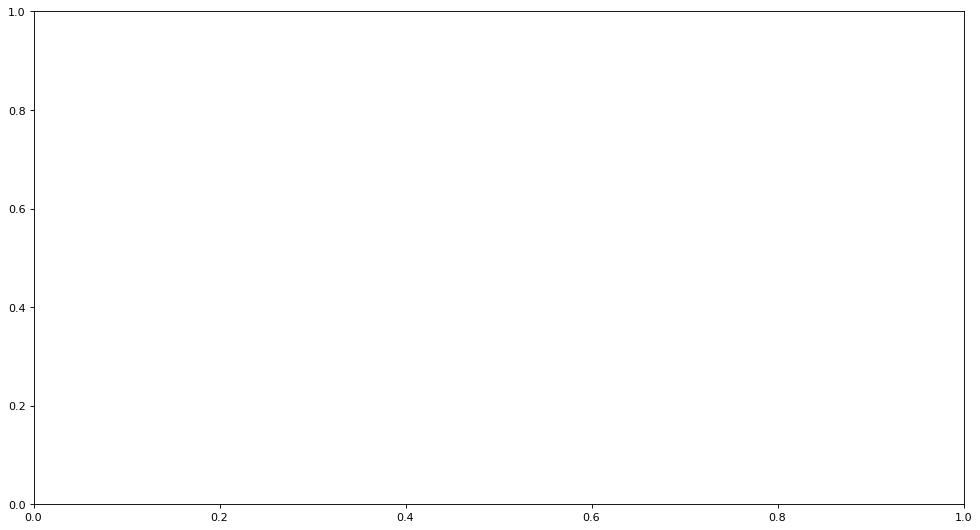

In [11]:
#Plot

plt.figure(figsize=(15, 8), dpi=80)

for i in range(len(freq_modes_sorted)):
    #if (i<len(true_f)):
    #    plt.axhline(y = true_f[i], color = 'r', linestyle = '--', label="True mode " + str(i+1))
    plt.plot(np.arange(0, len(acc)), freq_modes_sorted[i], linestyle="-", marker=".", label="Estimated mode " + str(i+1))

plt.grid()
plt.legend()
plt.xlabel("Realization #")
plt.ylabel("$f_n$ [Hz]")
#plt.savefig("plots/num_example_bad.jpg")
plt.show()